<a href="https://colab.research.google.com/github/amien1410/computer-vision-with-opencv5/blob/main/1_basic_commands.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import os
# import cv2
# import sys
import numpy
# import matplotlib.pyplot as plt
# from google.colab.patches import cv2_imshow

# !wget https://raw.githubusercontent.com/PacktPublishing/Learning-OpenCV-5-Computer-Vision-with-Python-Fourth-Edition/main/chapter02/MyPic.png
# !wget https://github.com/PacktPublishing/Learning-OpenCV-5-Computer-Vision-with-Python-Fourth-Edition/raw/main/chapter02/MyInputVid.avi
# !wget https://github.com/PacktPublishing/Learning-OpenCV-5-Computer-Vision-with-Python-Fourth-Edition/raw/main/chapter02/MyMultiPics.tiff

In [ ]:
#@title PNG to JPG
image = cv2.imread('MyPic.png')
if image is None:
    print('Failed to read image from file')
    sys.exit(1)

success = cv2.imwrite('MyPic.jpg', image)
if not success:
    print('Failed to write image to file')
    sys.exit(1)

In [5]:
#@title PNG to Grayscale
grayImage = cv2.imread('MyPic.png', cv2.IMREAD_GRAYSCALE)
if grayImage is None:
    print('Failed to read image from file')
    sys.exit(1)

success = cv2.imwrite('MyPicGray.png', grayImage)
if not success:
    print('Failed to write image to file')
    sys.exit(1)

In [ ]:
# Display the grayscale image
cv2_imshow(grayImage)

# Display the grayscale image using matplotlib
# plt.imshow(grayImage, cmap='gray')
# plt.title('Grayscale Image')
# plt.axis('off')  # Hide axis
# plt.show()

In [16]:
#@title MultiTIFF to Grayscale
success, grayImages = cv2.imreadmulti(
    'MyMultiPics.tiff', flags=cv2.IMREAD_GRAYSCALE)
if not success:
    print('Failed to read images from file')
    sys.exit(1)
print('Number of images:', len(grayImages))

success = cv2.imwritemulti('MyMultiPicsGray.tiff', grayImages)
if not success:
    print('Failed to write images to file')
    sys.exit(1)

Number of images: 4


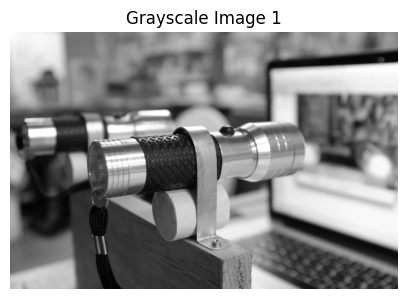

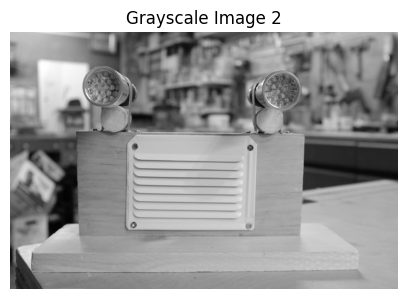

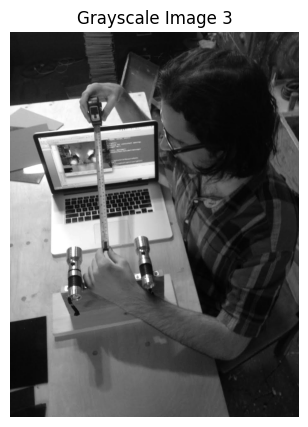

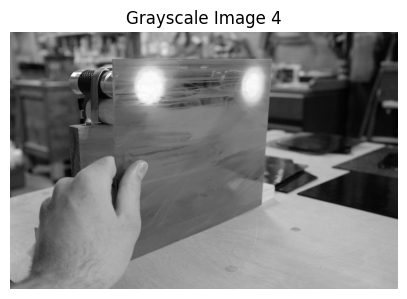

In [17]:
for i, img in enumerate(grayImages):
    plt.figure(figsize=(5, 5))
    plt.imshow(img, cmap='gray')
    plt.title(f'Grayscale Image {i + 1}')
    plt.axis('off')  # Hide axis
    plt.show()

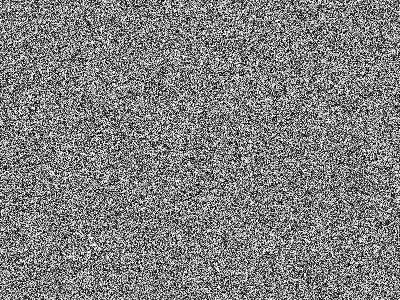

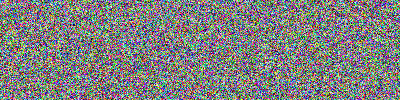

In [22]:
#@title Random Images
# Make an array of 120,000 random bytes.
randomByteArray = bytearray(os.urandom(120000))
flatNumpyArray = numpy.array(randomByteArray)

# Convert the array to make a 400x300 grayscale image.
grayImage = flatNumpyArray.reshape(300, 400)
cv2.imwrite('RandomGray.png', grayImage)

# Convert the array to make a 400x100 color image.
bgrImage = flatNumpyArray.reshape(100, 400, 3)
cv2.imwrite('RandomColor.png', bgrImage)

cv2_imshow(grayImage)
cv2_imshow(bgrImage)

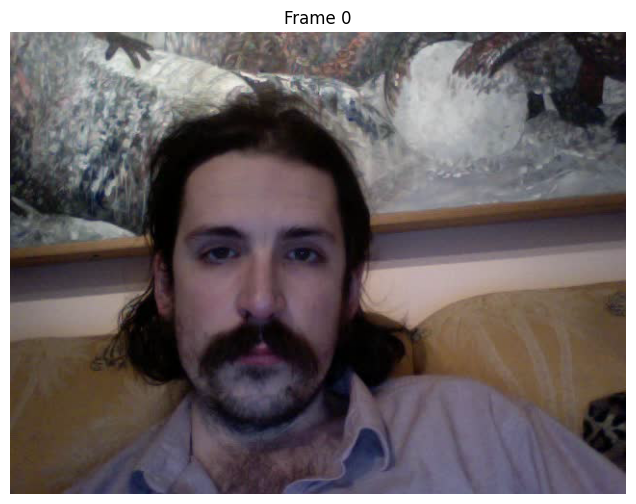

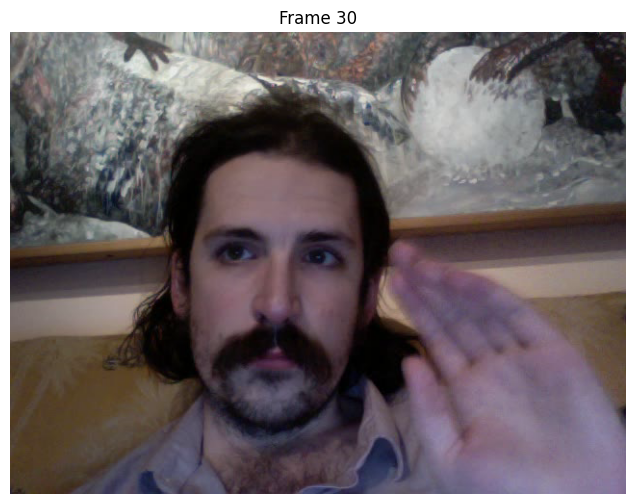

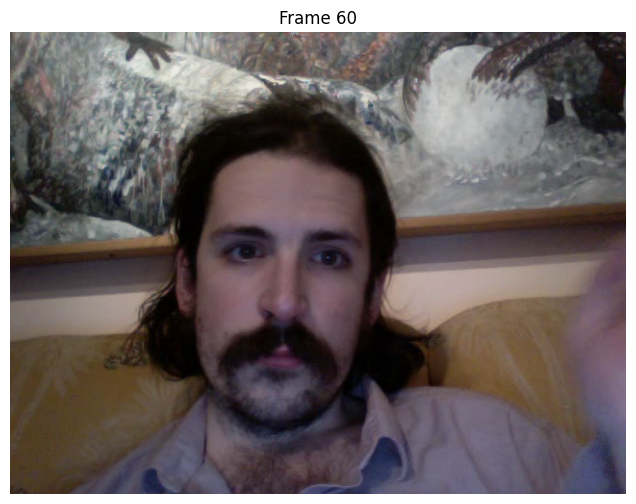

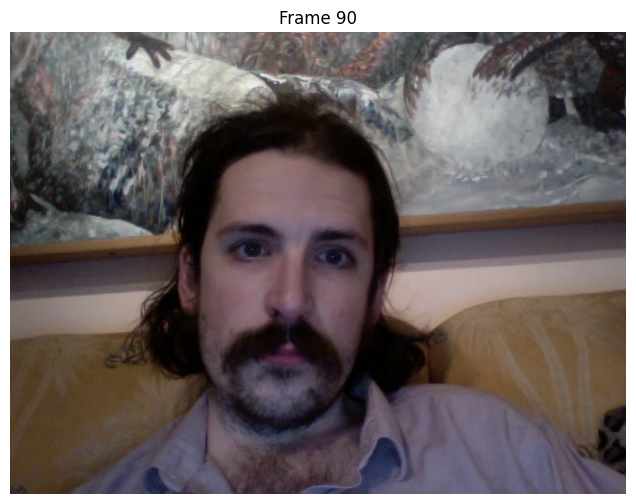

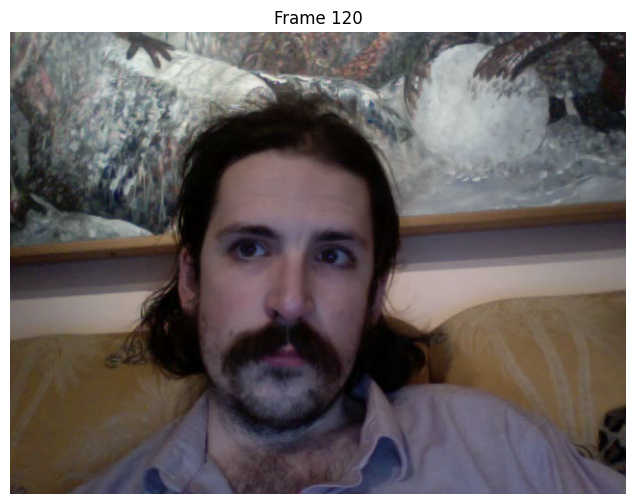

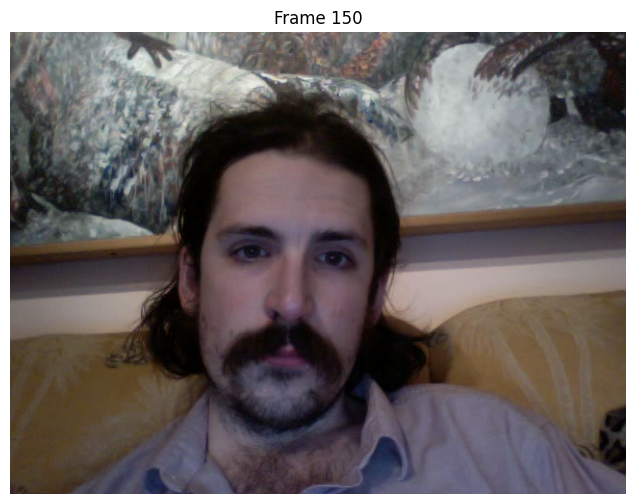

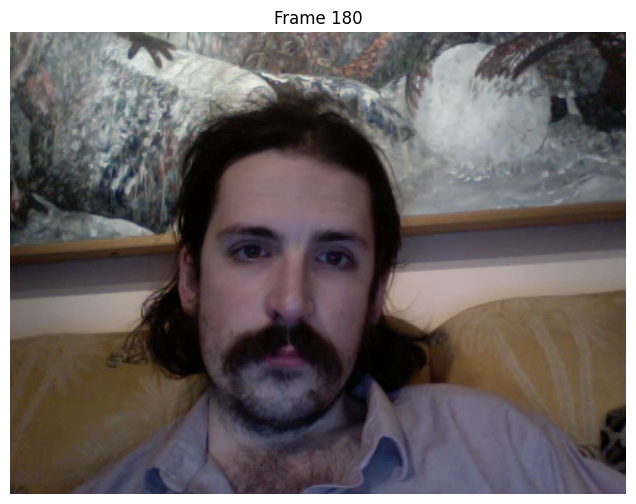

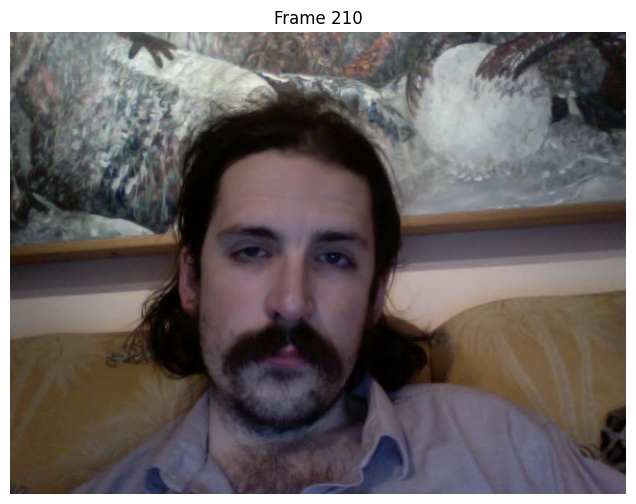

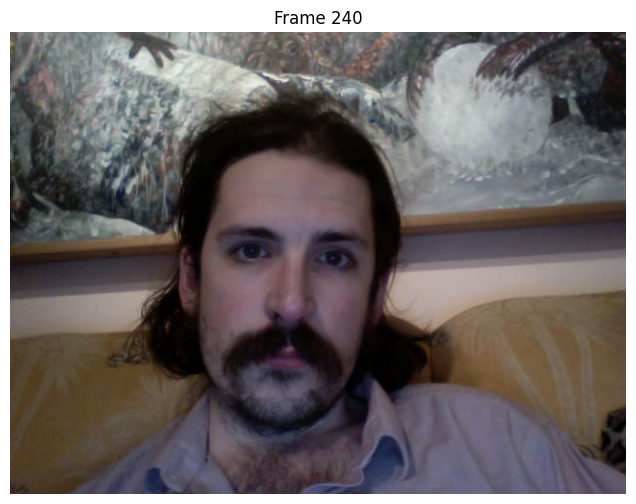

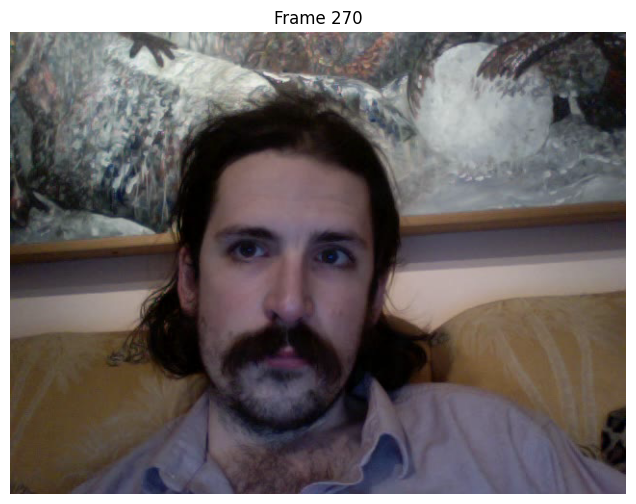

In [24]:
#@title Video copy to YUV

# Open the input video file
videoCapture = cv2.VideoCapture('MyInputVid.avi')
fps = videoCapture.get(cv2.CAP_PROP_FPS)
size = (int(videoCapture.get(cv2.CAP_PROP_FRAME_WIDTH)),
        int(videoCapture.get(cv2.CAP_PROP_FRAME_HEIGHT)))

# Open the output video file for writing
videoWriter = cv2.VideoWriter(
    'MyOutputVid.avi', cv2.VideoWriter_fourcc('I', '4', '2', '0'), fps, size)

# Read and process the video frames
success, frame = videoCapture.read()
frame_count = 0

while success:
    # Write the frame to the output video file
    videoWriter.write(frame)

    # Display every 30th frame using matplotlib
    if frame_count % 30 == 0:
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f'Frame {frame_count}')
        plt.axis('off')  # Hide axis
        plt.show()

    # Read the next frame
    success, frame = videoCapture.read()
    frame_count += 1

# Release the video objects
videoCapture.release()
videoWriter.release()

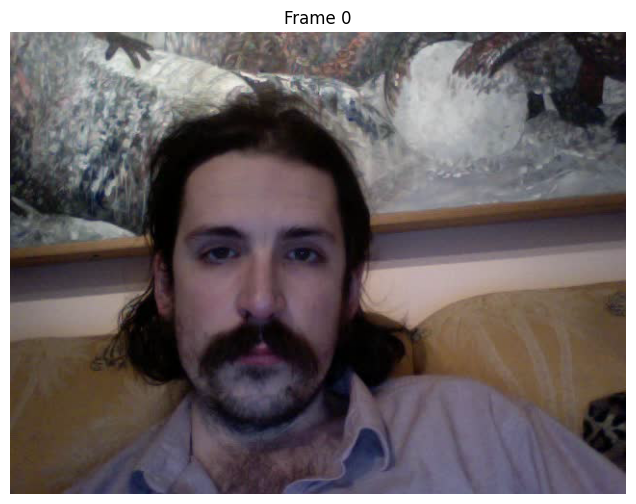

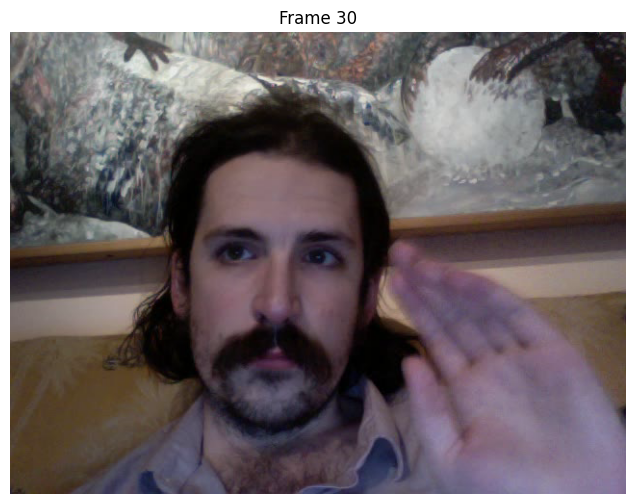

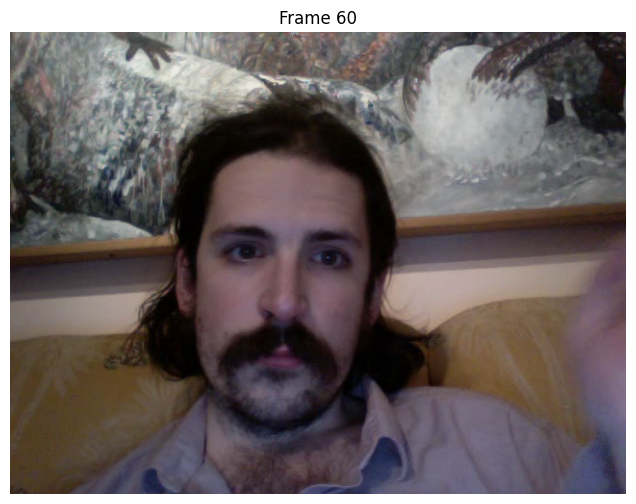

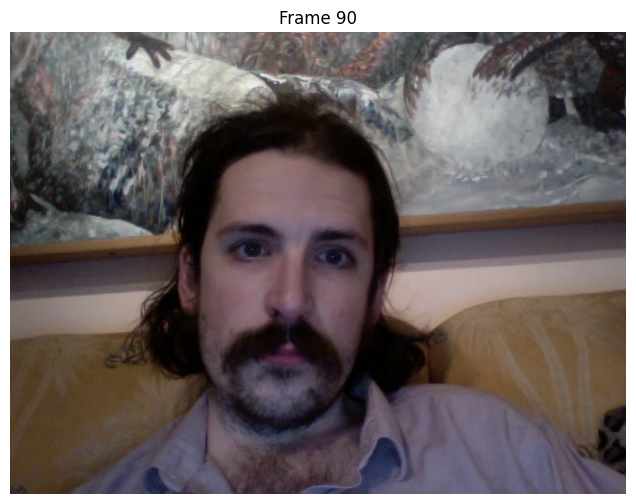

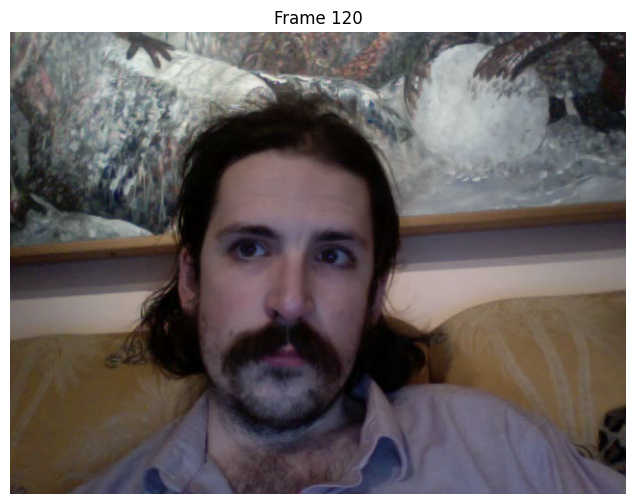

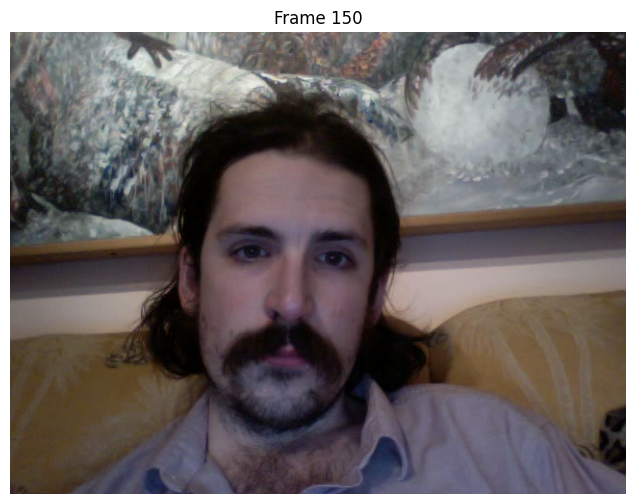

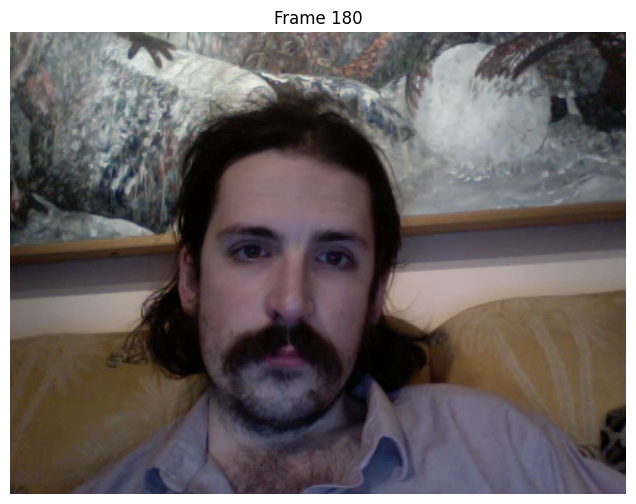

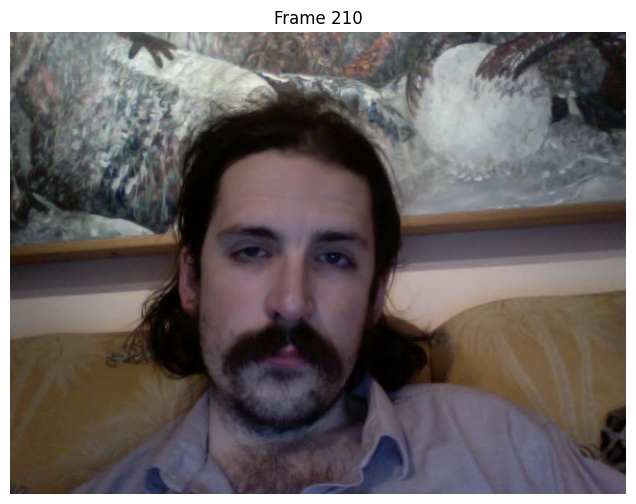

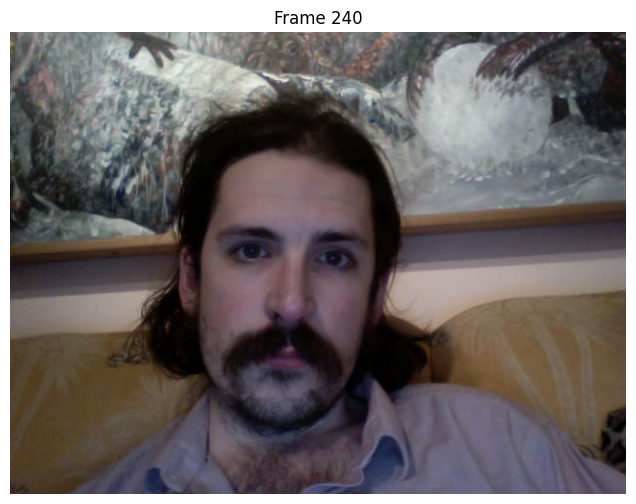

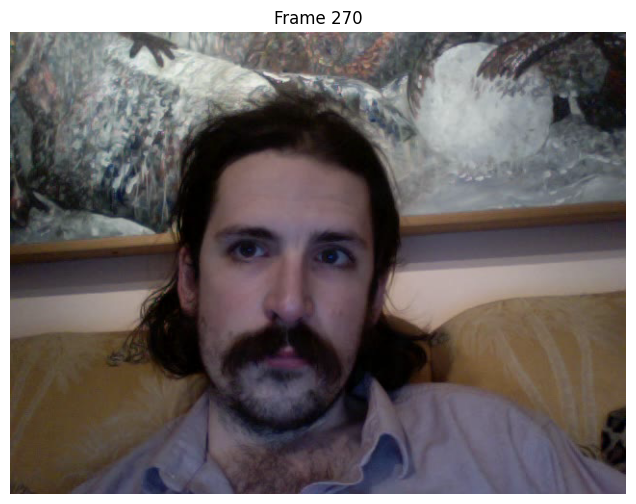

In [25]:
#@title Video copy to YUV - Acceleration

# Open the input video file with hardware acceleration
videoCapture = cv2.VideoCapture(
    'MyInputVid.avi', cv2.CAP_ANY,
    [cv2.CAP_PROP_HW_ACCELERATION, cv2.VIDEO_ACCELERATION_ANY]
)
fps = videoCapture.get(cv2.CAP_PROP_FPS)
size = (int(videoCapture.get(cv2.CAP_PROP_FRAME_WIDTH)),
        int(videoCapture.get(cv2.CAP_PROP_FRAME_HEIGHT)))

# Open the output video file for writing with hardware acceleration
videoWriter = cv2.VideoWriter(
    'MyOutputVid-Accell.avi', cv2.VideoWriter_fourcc('I', '4', '2', '0'), fps, size,
    [cv2.VIDEOWRITER_PROP_HW_ACCELERATION, cv2.VIDEO_ACCELERATION_ANY]
)

# Read and process the video frames
success, frame = videoCapture.read()
frame_count = 0

while success:
    # Write the frame to the output video file
    videoWriter.write(frame)

    # Display every 30th frame using matplotlib
    if frame_count % 30 == 0:
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f'Frame {frame_count}')
        plt.axis('off')  # Hide axis
        plt.show()

    # Read the next frame
    success, frame = videoCapture.read()
    frame_count += 1

# Release the video objects
videoCapture.release()
videoWriter.release()

<IPython.core.display.Javascript object>

Photo saved to photo.jpg


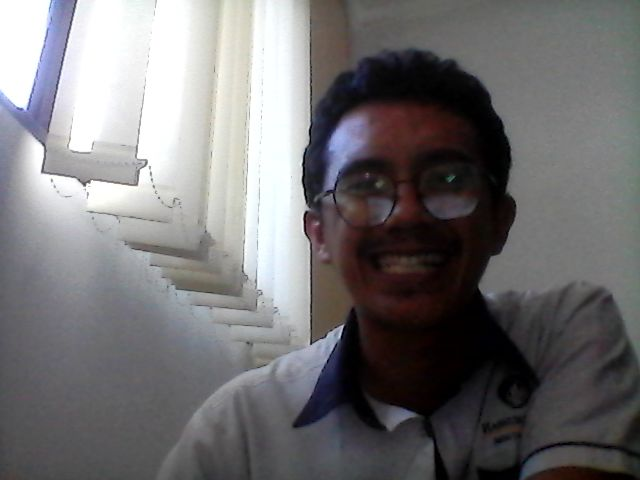

<IPython.core.display.Javascript object>

Finished recording video. Saved binary under filename in current working directory: video.mp4
Video saved to video.mp4


In [1]:
#@title Camera Capture
from IPython.display import display, Javascript, Image, HTML
from google.colab.output import eval_js
from base64 import b64decode, b64encode

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for Capture to be clicked.
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

def record_video(filename='video.mp4'):
    js = Javascript('''
        async function recordVideo() {
            const options = { mimeType: "video/webm; codecs=vp9" };
            const div = document.createElement('div');
            const capture = document.createElement('button');
            const stopCapture = document.createElement("button");
            capture.textContent = "Start Recording";
            capture.style.background = "green";
            capture.style.color = "white";

            stopCapture.textContent = "Stop Recording";
            stopCapture.style.background = "red";
            stopCapture.style.color = "white";
            div.appendChild(capture);

            const video = document.createElement('video');
            const recordingVid = document.createElement("video");
            video.style.display = 'block';

            const stream = await navigator.mediaDevices.getUserMedia({video: true});
            let recorder = new MediaRecorder(stream, options);
            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            await new Promise((resolve) => {
                capture.onclick = resolve;
            });
            recorder.start();
            capture.replaceWith(stopCapture);
            await new Promise((resolve) => stopCapture.onclick = resolve);
            recorder.stop();

            let recData = await new Promise((resolve) => recorder.ondataavailable = resolve);
            let arrBuff = await recData.data.arrayBuffer();
            stream.getVideoTracks()[0].stop();
            div.remove();

            let binaryString = "";
            let bytes = new Uint8Array(arrBuff);
            bytes.forEach((byte) => {
                binaryString += String.fromCharCode(byte);
            })
            return btoa(binaryString);
        }
    ''')
    try:
        display(js)
        data = eval_js('recordVideo({})')
        binary = b64decode(data)
        with open(filename, "wb") as video_file:
            video_file.write(binary)
        print(
            f"Finished recording video. Saved binary under filename in current working directory: {filename}"
        )
    except Exception as err:
        # In case any exceptions arise
        print(str(err))
    return filename

# Example usage
try:
    # Take a photo
    photo_filename = take_photo()
    print('Photo saved to {}'.format(photo_filename))

    # Show the photo which was just taken.
    display(Image(photo_filename))
except Exception as err:
    print("Error taking photo: ", str(err))

try:
    # Record a video
    video_filename = record_video()
    print(f"Video saved to {video_filename}")

    # Show the video which was just recorded.
    video_width = 300
    video_file = open(video_filename, "r+b").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    display(HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>"""))
except Exception as err:
    print("Error recording video: ", str(err))
